In [1]:
import os
import numpy as np

def load_attention_files_to_arrays(directory):
    """
    Loads all files in the specified directory into a list of numpy arrays.
    Assumes each file contains data readable by np.load or np.loadtxt.
    """
    arrays = []
    for filename in sorted(os.listdir(directory)):
        filepath = os.path.join(directory, filename)
        if os.path.isfile(filepath):
            try:
                # Try loading as a numpy binary file first
                arr = np.load(filepath)
            except Exception:
                # If that fails, try loading as a text file
                arr = np.loadtxt(filepath)
            arrays.append(arr)
    return arrays

def load_attention_files_to_dict(directory):
    """
    Loads all files in the specified directory into a dict of numpy arrays.
    Keys are filenames.
    """
    arrays = {}
    for filename in sorted(os.listdir(directory)):
        filepath = os.path.join(directory, filename)
        if os.path.isfile(filepath):
            try:
                arr = np.load(filepath)
            except Exception:
                arr = np.loadtxt(filepath)
            arrays[filename] = arr
    return arrays

In [2]:
attention_arrays = load_attention_files_to_dict("C:\\Users\\Acer\\Documents\\cmu\\research\\Anomaly-Transformer\\checkpoints\\attentions_k_3")

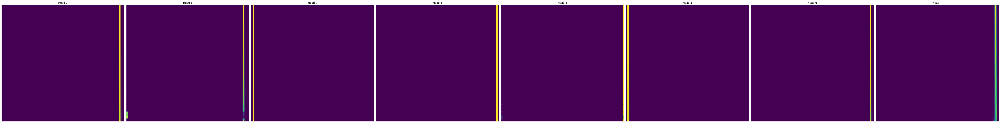

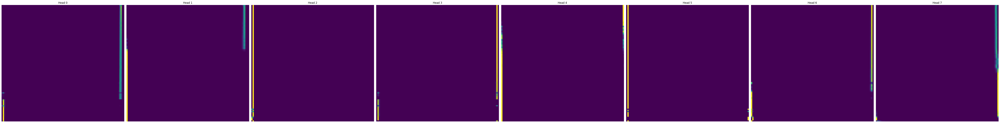

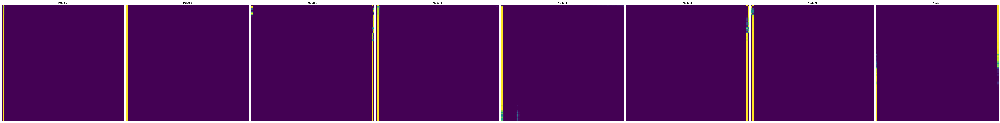

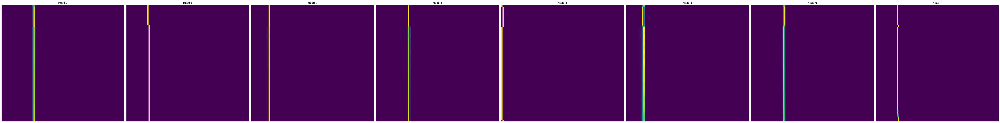

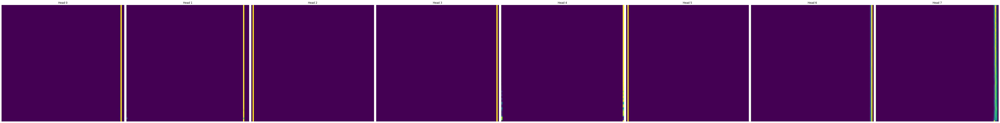

...

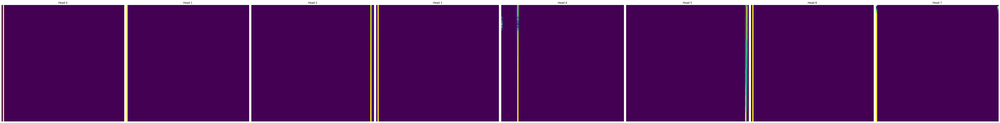

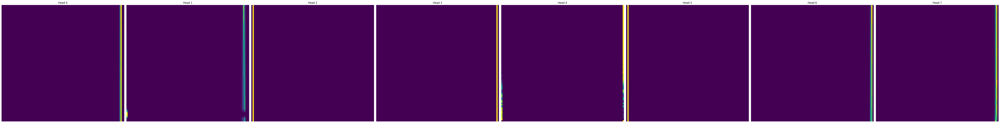

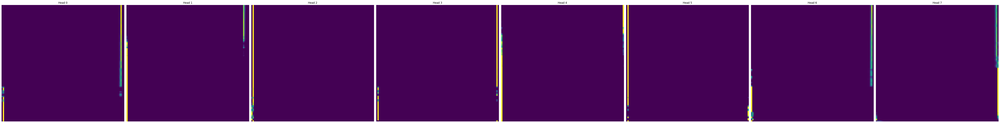

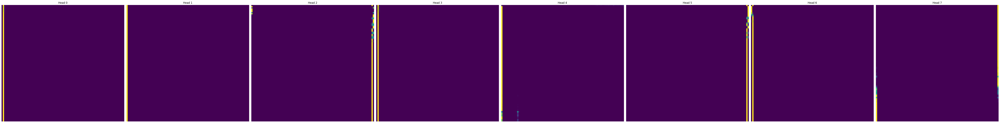

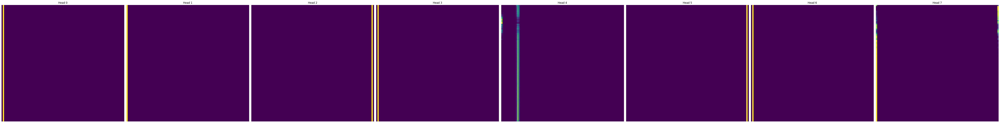

In [4]:
import matplotlib.pyplot as plt
# Load attention for layer 1 (first batch file example)
input_filename = 'attn_layer0_batch_000000.npy'
os.makedirs(os.path.join("attention_head_visualizations",input_filename.split('.')[0]), exist_ok=True)
attns = attention_arrays[input_filename]
# attns shape: (batch_size, n_heads, win_size, win_size)
sample_idx = 0  # which sample in the batch to visualize (0..batch_size-1)
for sample_idx in range(attns.shape[0]):
    B, H, S1, S2 = attns.shape

    # Create a single-row figure with H columns (one subplot per head)
    fig, axes = plt.subplots(1, H, figsize=(8 * H, 8))
    # If there's only one head, axes may not be an array
    if H == 1:
        axes = [axes]

    for h in range(H):
        ax = axes[h]
        attn = attns[sample_idx, h]
        im = ax.imshow(attn, aspect='auto', cmap='viridis')
        ax.set_title(f'Head {h}')
        ax.axis('off')

    # Add a single colorbar for the row of heads
    # fig.colorbar(im, ax=axes, fraction=0.02, pad=0.02)
    plt.tight_layout()
    plt.show()
    # plt.close() 
    filename = f"attention_head_visualizations/{input_filename.split('.')[0]}/attention_head_visualization_sample_{sample_idx}.png"    
    fig.savefig(filename)
    plt.close() 


In [10]:
from pathlib import Path
from typing import Optional, Union
import numpy as np
import matplotlib.pyplot as plt
import os
import warnings

def load_numpy_file(filepath: Union[str, Path]):
    """
    Load a numpy array from filepath. Tries np.load first, falls back to np.loadtxt.
    Accepts str or Path.
    """
    p = Path(filepath)
    if not p.is_file():
        raise FileNotFoundError(f"No such file: {filepath}")
    try:
        # prefer binary numpy format
        arr = np.load(p)
    except Exception:
        # fallback to text loader
        arr = np.loadtxt(p)
    return arr

def plot_sample_from_array(arr, sample_number: int, ax: Optional[object] = None,
                           show: bool = True, save_path: Optional[Union[str, Path]] = None):
    """
    Plot one sample from a numpy array with shape [N, 100, 1] (or similar).
    sample_number: 1-based index in range [1..N]
    - x axis: index (0..99)
    - y axis: values (100 points)
    If save_path is provided the figure is saved to that path.
    """
    if not isinstance(sample_number, int):
        raise TypeError("sample_number must be an integer (1-based).")
    N = arr.shape[0]
    if sample_number < 1 or sample_number > N:
        raise ValueError(f"sample_number must be between 1 and {N} (inclusive).")
    idx = sample_number - 1

    data = np.asarray(arr[idx]).squeeze()
    if data.ndim != 1:
        # try to flatten the trailing dims to 1D
        data = data.flatten()
    x = np.arange(data.shape[0])

    created_fig = False

    # Try to display corresponding attention-head image (if present) before plotting the line graph
    attn_dir = Path(r"C:\\Users\\Acer\\Documents\\cmu\\research\\Anomaly-Transformer\\attention_head_visualizations\\attn_layer0_batch_000000")
    img_path = os.path.join(attn_dir, f"attention_head_visualization_sample_{sample_number}.png")
    if os.path.isfile(img_path):
        try:
            img = plt.imread(img_path)
            fig_img, ax_img = plt.subplots(figsize=(16, 8))
            ax_img.imshow(img)
            ax_img.axis("off")
            ax_img.set_title(f"Attention| heads (sample {sample_number})")
            plt.show()
            plt.close(fig_img)
        except Exception as e:
            warnings.warn(f"Could not load/show attention image {img_path}: {e}")
    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 4))
        created_fig = True

    ax.plot(x, data, marker='o', markersize=3, linestyle='-')
    ax.set_xlabel("Index")
    ax.set_ylabel("Value")
    ax.set_title(f"Sample {sample_number} (array index {idx})")
    ax.grid(True)

    if save_path:
        out_path = Path(save_path)
        if out_path.parent:
            out_path.parent.mkdir(parents=True, exist_ok=True)
        try:
            if created_fig:
                fig.savefig(out_path, bbox_inches='tight')
            else:
                ax.figure.savefig(out_path, bbox_inches='tight')
        except Exception as e:
            warnings.warn(f"Could not save figure to {save_path}: {e}")

    if show:
        plt.show()

def plot_sample_from_file(filepath: Union[str, Path] = r"C:\Users\Acer\Documents\cmu\research\Anomaly-Transformer\checkpoints\attentions_k_3\input_batch_000000.npy",
                          sample_number: int = 1, save_path: Optional[Union[str, Path]] = None, show: bool = True):
    """
    Convenience: load the file and plot the requested 1-based sample_number.
    """
    arr = load_numpy_file(filepath)
    plot_sample_from_array(arr, sample_number, show=show, save_path=save_path)

# Example usage (uncomment to run):
# plot_sample_from_file(sample_number=5)
# plot_sample_from_file(sample_number=10, save_path="plots/sample_10.png")

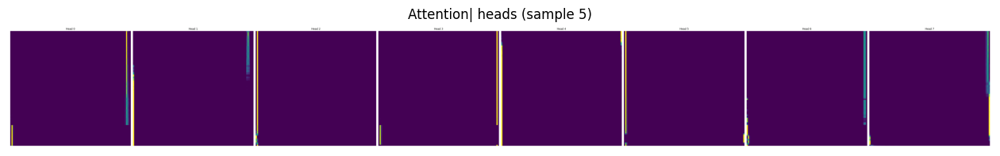

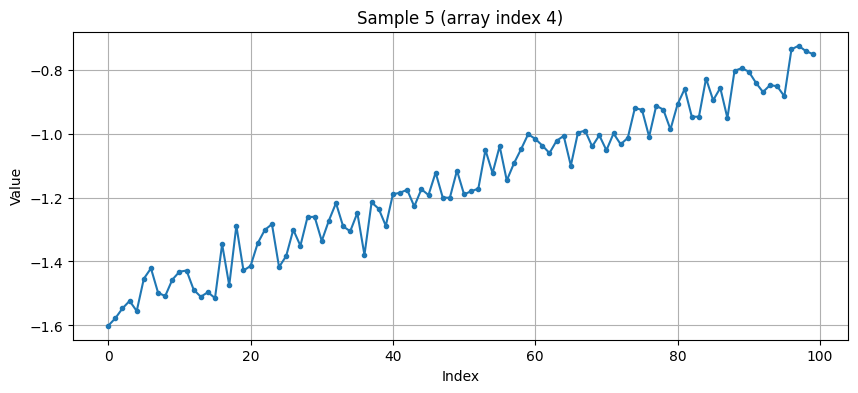

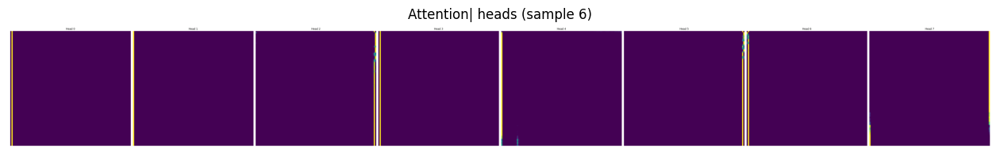

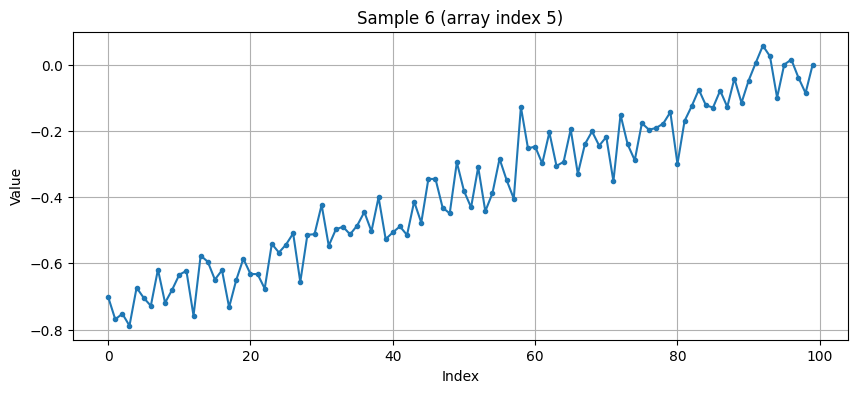

In [17]:
plot_sample_from_file(sample_number=5) 
plot_sample_from_file(sample_number=6)  # uses the default filepath above
# plot_sample_from_file(sample_number=5, save_path="plots_SIGNAL/sample_5.png")

In [23]:
from data_factory.data_loader import get_loader_segment
train_loader = get_loader_segment(data_path='./dataset/SIGNAL', batch_size=256, win_size=800, step=100, mode='train', dataset='PSM')
iter_train = iter(train_loader)
batch = next(iter_train)

test: (100000, 1)
train: (100000, 1)


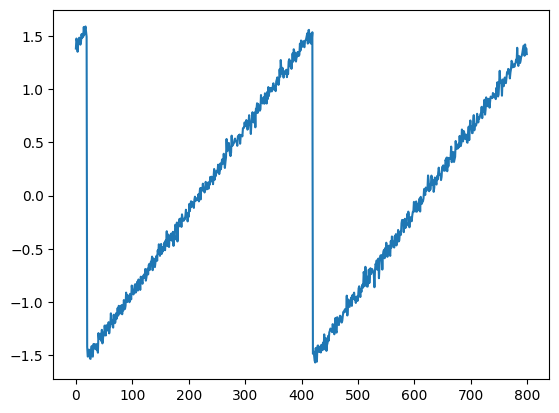

In [24]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
input_train_data = pd.read_csv("./dataset/SIGNAL/train.csv")
plt.plot(batch[0][5].reshape(-1))  # (256, 100, 1)

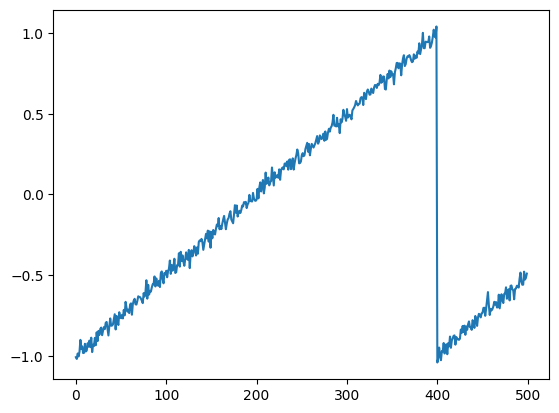

In [22]:
plt.plot(input_train_data['feature_0'].values[0:500])